This script clusters the different features and representations exported from .feature_extraction.ipynb.

1) Nearest neighbour graphs of all representations are created based on euclidian distance
2) Embeddings are created using **UMAP** and **Hopkins** statistic computed for each embeddings- and original feature space
3) The following three clustering algorithms are applied:
    - **kMeans**
    - **HDBSCAN**
    - **Leiden**
4) All resulting clusterings are evaluated with
    - **silhouette score**
    - **V-measure**

In [261]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import json

import umap
from umap.umap_ import nearest_neighbors
import seaborn as sns

from sklearn.preprocessing import StandardScaler
from matplotlib.patches import Patch

from mpl_toolkits.mplot3d import Axes3D

In [262]:
RANDOM_SEED = 42

In [263]:
calls_df = pd.read_csv('features_and_spectrograms.csv')
calls_df['log_padded_spectrogram'] = calls_df['log_padded_spectrogram'].apply(lambda x: np.array(json.loads(x)))


In [264]:
calls_df["log_padded_spectrogram"].iloc[0]

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [265]:
print(len(calls_df[calls_df.isna().any(axis=1)]))
calls_df = calls_df.dropna()

825


Only keep a random subset of recruitment, departure and contact calls to balance the dataset and prevent overcrowding the visualizations.

In [266]:
subset_size = 500

subsample_sizes = {
    'recruitment': subset_size,
    'contact': subset_size,
    'departure': subset_size,
    'distance': subset_size,
    'unknown': 0,
}

# Randomly subsample per call type
def subsample_group(group):
    call_type = group.name  # Group name corresponds to call type
    if call_type in subsample_sizes:
        return group.sample(n=subsample_sizes[call_type], random_state=42)
    return group  # Return untouched if no subsampling is needed

# Group by type and apply subsampling
calls_df = calls_df.groupby('call_type', group_keys=False).apply(subsample_group)

/var/folders/kl/qgqbw3bd42bf_tybhvnz9vxh0000gn/T/ipykernel_7008/1700788368.py:19: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  calls_df = calls_df.groupby('call_type', group_keys=False).apply(subsample_group)


/var/folders/kl/qgqbw3bd42bf_tybhvnz9vxh0000gn/T/ipykernel_7008/1510808998.py:4: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  hist = sns.histplot(


[]

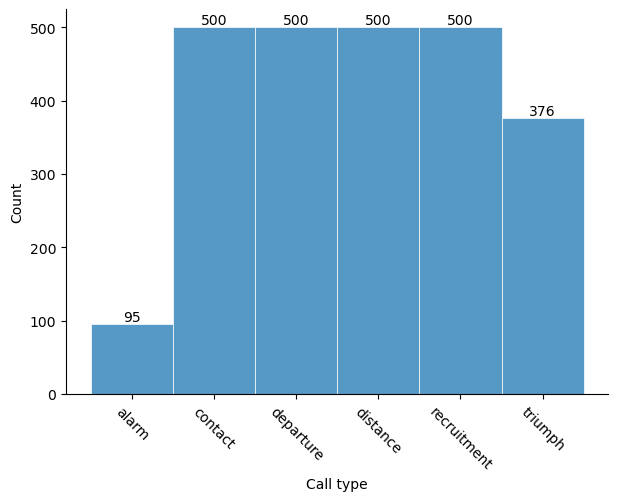

In [267]:
f, ax = plt.subplots(figsize=(7, 5))
sns.despine(f)

hist = sns.histplot(
    calls_df,
    x="call_type",
    multiple="stack",
    palette="viridis",
    edgecolor="1",
    linewidth=.5,
)

plt.xticks(rotation=-45)
ax.set_xlabel("Call type")

# Add counts
for p in hist.patches:
    height = p.get_height()
    x = p.get_x() + p.get_width() / 2
    ax.annotate(f'{int(height)}', (x, height), ha='center', va='bottom')
    
plt.plot()

In [268]:
from sklearn.preprocessing import LabelEncoder

In [269]:
le = LabelEncoder()
le.fit(calls_df["call_type"])
calls_df["encoded_call_type"] = le.transform(calls_df["call_type"])

In [270]:
calls_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2471 entries, 218 to 7364
Data columns (total 33 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   track_ID                2471 non-null   object 
 1   clip_ID                 2471 non-null   object 
 2   goose_ID                2471 non-null   object 
 3   call_type               2471 non-null   object 
 4   waveform                2471 non-null   object 
 5   sr                      2471 non-null   int64  
 6   filepath                2471 non-null   object 
 7   lfccs                   2471 non-null   object 
 8   duration                2471 non-null   float64
 9   normalized_log_length   2471 non-null   float64
 10  log_target_duration     2471 non-null   float64
 11  log_padded_spectrogram  2471 non-null   object 
 12  log_padded_lfccs        2471 non-null   object 
 13  f0mean                  2471 non-null   float64
 14  f0range                 2471 non-null   flo

# Cluster and validate the different represenations

## NN Graphs and UMAP embeddings

In [271]:
N_NEIGHBORS = 15
DISTANCE_METRIC = "minkowski" #with default p=2 corresponds to euclidian distance

#### Embed predefined audio features

In [272]:
features_scaled = StandardScaler().fit_transform(calls_df.drop(columns=["call_type", "track_ID", "clip_ID", "goose_ID", "waveform", "sr", "filepath", "normalized_log_length", "log_target_duration", "log_padded_spectrogram", "lfccs", "log_padded_lfccs"]))
# considering scaling: https://github.com/lmcinnes/umap/issues/66

In [273]:
nn_results_paf = nearest_neighbors(
    features_scaled,
    n_neighbors=N_NEIGHBORS,
    metric=DISTANCE_METRIC,
    metric_kwds={},
    angular=False,
    random_state=RANDOM_SEED,
    verbose=True,
)

Fri Jan  3 10:35:56 2025 Finding Nearest Neighbors
Fri Jan  3 10:35:56 2025 Building RP forest with 7 trees
Fri Jan  3 10:35:56 2025 NN descent for 11 iterations
	 1  /  11
	 2  /  11
	 3  /  11
	Stopping threshold met -- exiting after 3 iterations
Fri Jan  3 10:35:56 2025 Finished Nearest Neighbor Search


In [274]:
def display_nearest_neighbours(nn_graph, df, n_examples=5, n_neighbors=15):
    fig, axs = plt.subplots(nrows=n_examples, ncols=n_neighbors, figsize=(n_neighbors, n_examples))

    for i in range(n_examples):
        for j in range(n_neighbors):
            axs[i, j].matshow(df.iloc[nn_graph[0][i][j]]["log_padded_spectrogram"], origin="lower", cmap="magma", aspect="auto")
            axs[i, j].axis("off")
    plt.tight_layout()
    plt.show()

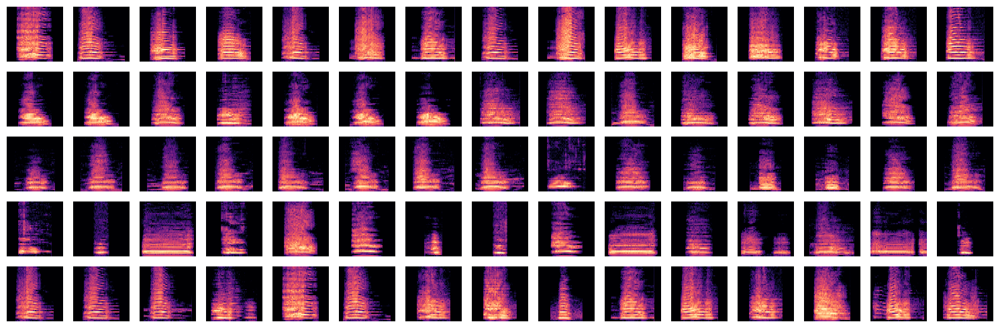

In [275]:
display_nearest_neighbours(nn_results_paf, calls_df)

In [276]:
embeddings_paf = umap.UMAP(precomputed_knn=nn_results_paf, n_neighbors=15, n_components=2, min_dist=0.1, random_state=RANDOM_SEED).fit_transform(features_scaled)

/Users/lenagies/anaconda3/envs/goose_vocalizations/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


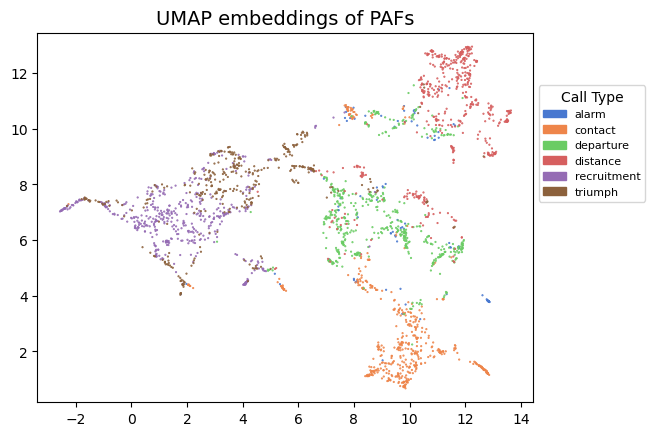

In [277]:
unique_call_types = calls_df["call_type"].unique()
color_palette = sns.color_palette("muted", len(unique_call_types))
call_type_to_color = {call_type: color for call_type, color in zip(unique_call_types, color_palette)}

# Assign colors to points
colors = [call_type_to_color[call_type] for call_type in calls_df["call_type"]]

# Scatter plot
plt.scatter(
    embeddings_paf[:, 0],
    embeddings_paf[:, 1],
    c=colors,
    s=0.3
)
plt.gca().set_aspect('equal', 'datalim')
plt.title('UMAP embeddings of PAFs', fontsize=14)

# Legend
legend_patches = [Patch(color=color, label=call_type) for call_type, color in call_type_to_color.items()]
plt.legend(
    handles=legend_patches,
    title="Call Type",
    fontsize=8,
    title_fontsize=10,
    loc="center left",
    bbox_to_anchor=(1.0, 0.7)
)

plt.show()

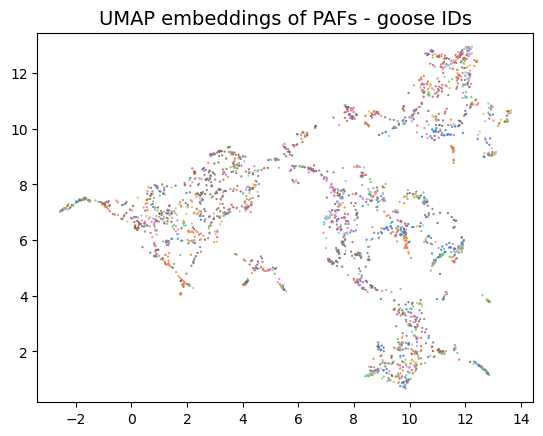

In [278]:
unique_goose_ids = calls_df["goose_ID"].unique()
color_palette = sns.color_palette("muted", len(unique_goose_ids))
goose_id_to_color = {goose_id: color for goose_id, color in zip(unique_goose_ids, color_palette)}

# Assign colors to points
colors = [goose_id_to_color[goose_id] for goose_id in calls_df["goose_ID"]]

# Scatter plot
plt.scatter(
    embeddings_paf[:, 0],
    embeddings_paf[:, 1],
    c=colors,
    s=0.3
)
plt.gca().set_aspect('equal', 'datalim')
plt.title('UMAP embeddings of PAFs - goose IDs', fontsize=14)

# Legend
# legend_patches = [Patch(color=color, label=goose_id) for goose_id, color in goose_id_to_color.items()]
# plt.legend(
#     handles=legend_patches,
#     title="Goose ID",
#     fontsize=8,
#     title_fontsize=10,
#     loc="center left",
#     bbox_to_anchor=(1.0, 0.7)
# )

plt.show()

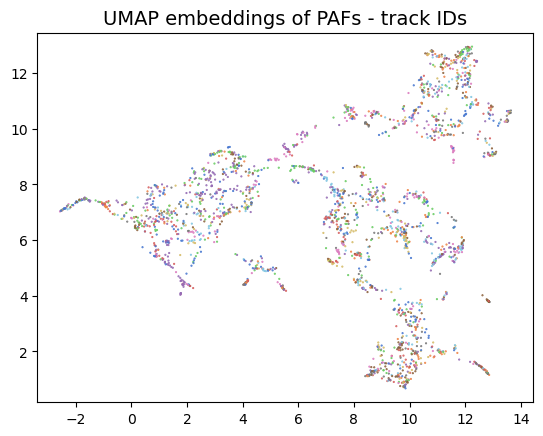

In [279]:
unique_track_ids = calls_df["track_ID"].unique()
color_palette = sns.color_palette("muted", len(unique_track_ids))
goose_id_to_color = {track_id: color for track_id, color in zip(unique_track_ids, color_palette)}

# Assign colors to points
colors = [goose_id_to_color[track_id] for track_id in calls_df["track_ID"]]

# Scatter plot
plt.scatter(
    embeddings_paf[:, 0],
    embeddings_paf[:, 1],
    c=colors,
    s=0.3
)
plt.gca().set_aspect('equal', 'datalim')
plt.title('UMAP embeddings of PAFs - track IDs', fontsize=14)

plt.show()

/var/folders/kl/qgqbw3bd42bf_tybhvnz9vxh0000gn/T/ipykernel_7008/1209294293.py:30: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(


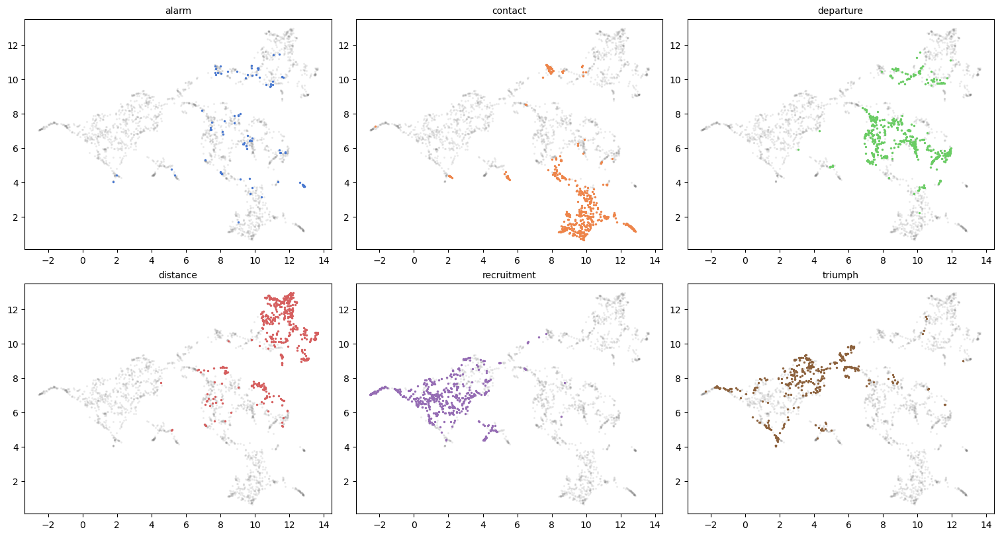

In [339]:
# Plot embedding per call type category
unique_call_types = calls_df["call_type"].unique()

cols = 3
rows = 2

fig, axes = plt.subplots(rows, cols, figsize=(5 * cols, 4 * rows), constrained_layout=True)
axes = axes.flatten()

# Determine the global limits to set equal axes
x_min, x_max = embeddings_paf[:, 0].min()-.8, embeddings_paf[:, 0].max()+.8
y_min, y_max = embeddings_paf[:, 1].min()-1.5, embeddings_paf[:, 1].max()+1.5

for i, call_type in enumerate(unique_call_types):
    ax = axes[i]

    ax.scatter(
        embeddings_paf[:, 0],
        embeddings_paf[:, 1],
        c="grey",
        alpha=0.1,
        s=2
    )

    # Filter embeddings for current call type
    mask = calls_df["call_type"] == call_type
    filtered_embeddings = embeddings_paf[mask]
    color = call_type_to_color[call_type]
    
    ax.scatter(
        filtered_embeddings[:, 0],
        filtered_embeddings[:, 1],
        c=color,
        alpha=1,
        s=2
    )
    ax.set_title(call_type, fontsize=10)
    ax.set_xlim(x_min, x_max)
    ax.set_ylim(y_min, y_max)
    ax.set_aspect('equal', 'datalim')

plt.show()

#### Embed spectrograms

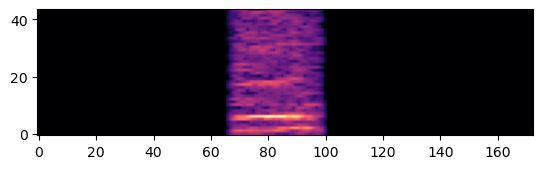

(44, 173)


In [281]:
# longest call
#vocalization = calls_df.loc[calls_df["duration"].idxmax()]
# random call
vocalization = calls_df.iloc()[np.random.randint(0, len(calls_df))]

plt.imshow(vocalization["log_padded_spectrogram"], origin="lower", cmap="magma")
plt.show()
print(vocalization["log_padded_spectrogram"].shape)

In [282]:
labels_and_spectrograms = []
for idx, row in calls_df.iterrows():
    labels_and_spectrograms.append([row["call_type"], row["track_ID"], row["goose_ID"], *row["log_padded_spectrogram"].flatten()])

In [283]:
column_names = ["call_type", "track_ID", "goose_ID"]
for i in range(len(calls_df.iloc[0]["log_padded_spectrogram"].flatten())):
    column_names.append(i)

In [284]:
labels_and_spectrograms_df = pd.DataFrame(labels_and_spectrograms, columns=column_names, index=None) 
labels_and_spectrograms_df.head()

,call_type,track_ID,goose_ID,0,1,2,3,4,5,6,...,7602,7603,7604,7605,7606,7607,7608,7609,7610,7611
0,alarm,GT00052,Dagobert,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,alarm,GT00058,Besenstiel,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,alarm,GT00055,Lausbursch,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,alarm,GT00989,unknown,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,alarm,GT00053,Dagobert,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


##### UMAP

In [285]:
labels_and_spectrograms_scaled = StandardScaler().fit_transform(labels_and_spectrograms_df.drop(columns=["call_type", "track_ID", "goose_ID"]))

In [286]:
nn_results_spec = nearest_neighbors(
    labels_and_spectrograms_scaled,
    n_neighbors=N_NEIGHBORS,
    metric=DISTANCE_METRIC,
    metric_kwds={},
    angular=False,
    random_state=RANDOM_SEED,
    verbose=True,
)

Fri Jan  3 10:36:12 2025 Finding Nearest Neighbors
Fri Jan  3 10:36:12 2025 Building RP forest with 7 trees
Fri Jan  3 10:36:12 2025 NN descent for 11 iterations
	 1  /  11
	 2  /  11
	 3  /  11
	Stopping threshold met -- exiting after 3 iterations
Fri Jan  3 10:36:13 2025 Finished Nearest Neighbor Search


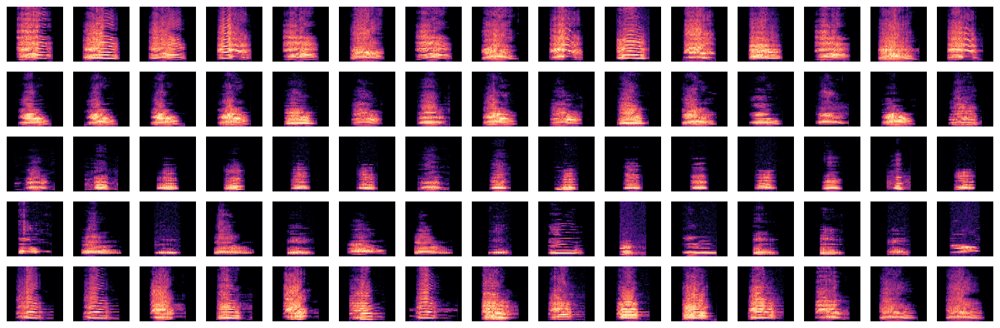

In [287]:
display_nearest_neighbours(nn_results_spec, calls_df)

In [288]:
embeddings_spec = umap.UMAP(precomputed_knn=nn_results_spec, n_neighbors=N_NEIGHBORS, n_components=2, min_dist=0.1, random_state=RANDOM_SEED).fit_transform(labels_and_spectrograms_scaled)

/Users/lenagies/anaconda3/envs/goose_vocalizations/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


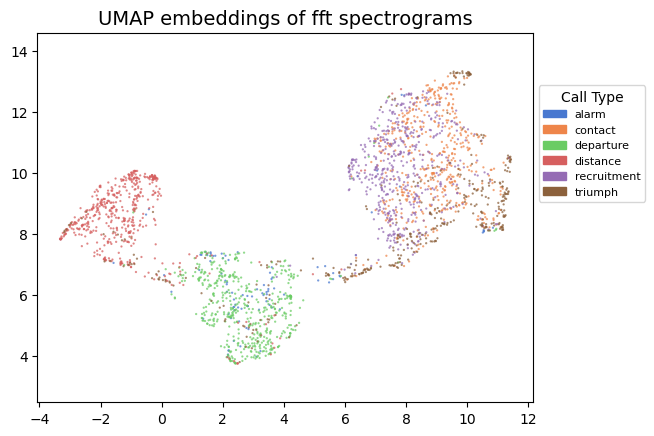

In [289]:
unique_call_types = labels_and_spectrograms_df["call_type"].unique()
color_palette = sns.color_palette("muted", len(unique_call_types))
call_type_to_color = {call_type: color for call_type, color in zip(unique_call_types, color_palette)}

# Assign colors to points
colors = [call_type_to_color[call_type] for call_type in labels_and_spectrograms_df["call_type"]]

# Scatter plot
plt.scatter(
    embeddings_spec[:, 0],
    embeddings_spec[:, 1],
    c=colors,
    alpha=0.7,
    s=0.4
)
plt.gca().set_aspect('equal', 'datalim')
plt.title('UMAP embeddings of fft spectrograms', fontsize=14)

# Legend
legend_patches = [Patch(color=color, label=call_type) for call_type, color in call_type_to_color.items()]
plt.legend(
    handles=legend_patches,
    title="Call Type",
    fontsize=8,
    title_fontsize=10,
    loc="center left",
    bbox_to_anchor=(1.0, 0.7)
)

plt.show()

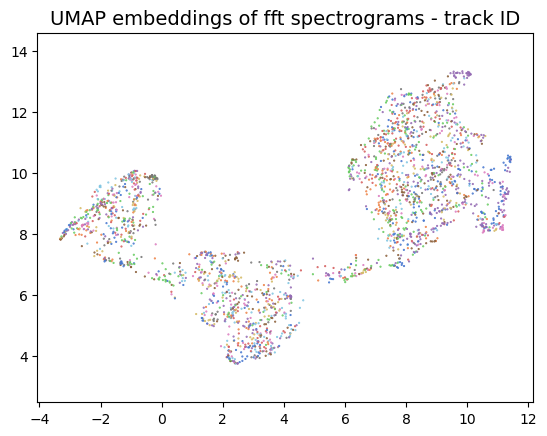

In [290]:
unique_track_ids = labels_and_spectrograms_df["track_ID"].unique()
color_palette = sns.color_palette("muted", len(unique_track_ids))
track_id_to_color = {track_id: color for track_id, color in zip(unique_track_ids, color_palette)}

# Assign colors to points
colors = [track_id_to_color[track_id] for track_id in labels_and_spectrograms_df["track_ID"]]

# Scatter plot
plt.scatter(
    embeddings_spec[:, 0],
    embeddings_spec[:, 1],
    c=colors,
    s=0.3
)
plt.gca().set_aspect('equal', 'datalim')
plt.title('UMAP embeddings of fft spectrograms - track ID', fontsize=14)

# legend_patches = [Patch(color=color, label=track_id) for track_id, color in track_id_to_color.items()]
# plt.legend(
#     handles=legend_patches,
#     title="Track_ID",
#     fontsize=8,
#     title_fontsize=10,
#     loc="center left",
#     bbox_to_anchor=(1.0, 0.7)
# )

plt.show()

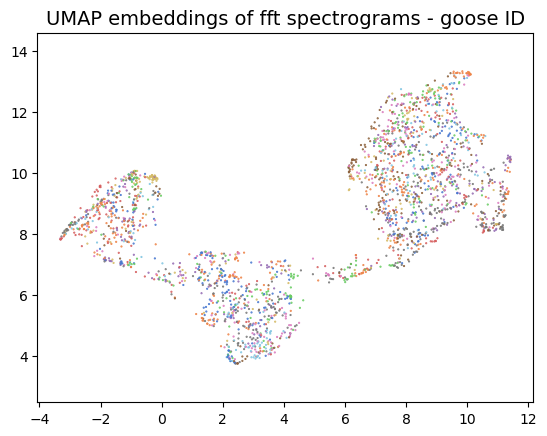

In [291]:
unique_goose_ids = labels_and_spectrograms_df["goose_ID"].unique()
color_palette = sns.color_palette("muted", len(unique_goose_ids))
goose_id_to_color = {goose_id: color for goose_id, color in zip(unique_goose_ids, color_palette)}

# Assign colors to points
colors = [goose_id_to_color[goose_id] for goose_id in labels_and_spectrograms_df["goose_ID"]]

# Scatter plot
plt.scatter(
    embeddings_spec[:, 0],
    embeddings_spec[:, 1],
    c=colors,
    s=0.3
)
plt.gca().set_aspect('equal', 'datalim')
plt.title('UMAP embeddings of fft spectrograms - goose ID', fontsize=14)

# Legend
# legend_patches = [Patch(color=color, label=goose_id) for goose_id, color in goose_id_to_color.items()]
# plt.legend(
#     handles=legend_patches,
#     title="Goose ID",
#     fontsize=8,
#     title_fontsize=10,
#     loc="center left",
#     bbox_to_anchor=(1.0, 0.7)
# )

plt.show()

In [292]:
embeddings3d = umap.UMAP(precomputed_knn=nn_results_spec, n_neighbors=N_NEIGHBORS, n_components=3, min_dist=0.1).fit_transform(labels_and_spectrograms_scaled)

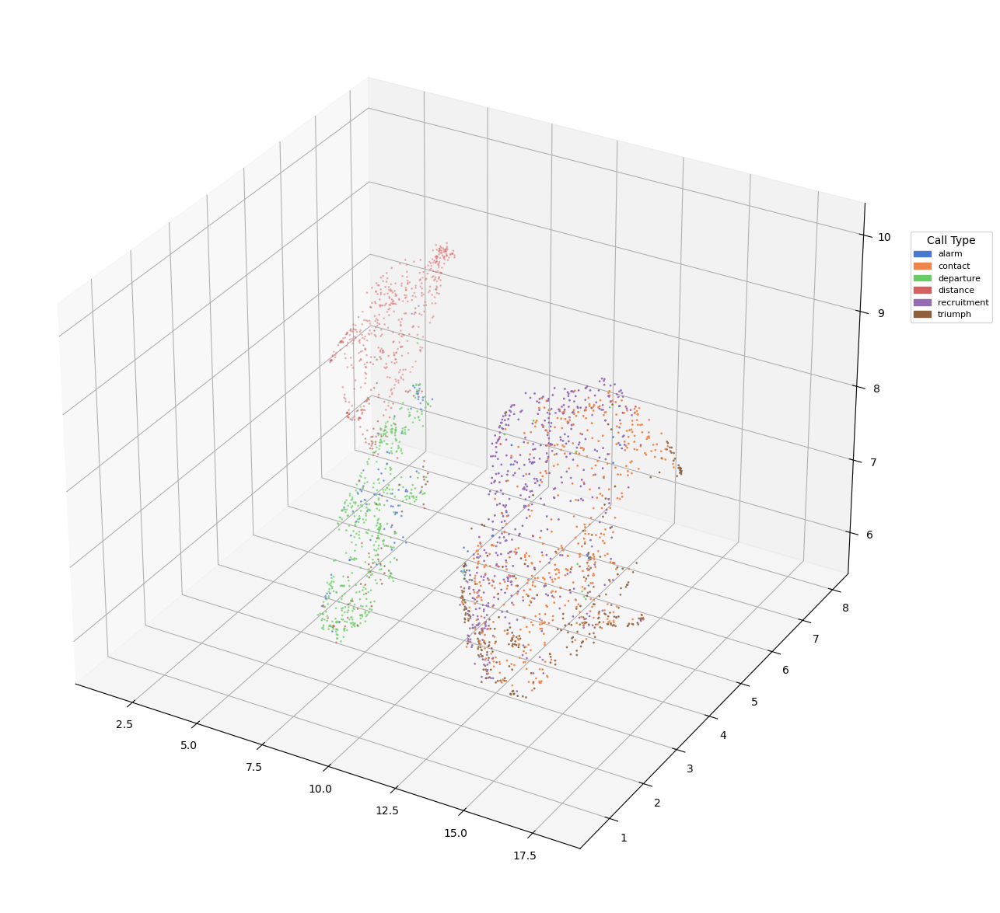

In [293]:
unique_goose_ids = labels_and_spectrograms_df["call_type"].unique()
color_palette = sns.color_palette("muted", len(unique_goose_ids))
goose_id_to_color = {call_type: color for call_type, color in zip(unique_goose_ids, color_palette)}

# Assign colors to points
colors = [goose_id_to_color[call_type] for call_type in labels_and_spectrograms_df["call_type"]]

# for 3D
fig = plt.figure(figsize=(15,15))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot in 3D
ax.scatter( 
    embeddings3d[:, 0],
    embeddings3d[:, 1],
    embeddings3d[:, 2],
    c=colors,
    s=1)

legend_patches = [Patch(color=color, label=call_type) for call_type, color in goose_id_to_color.items()]
plt.legend(
    handles=legend_patches,
    title="Call Type",
    fontsize=8,
    title_fontsize=10,
    loc="center left",
    bbox_to_anchor=(1.0, 0.7)
)

##### Visualize leftmost cluster to see different call types in more detail

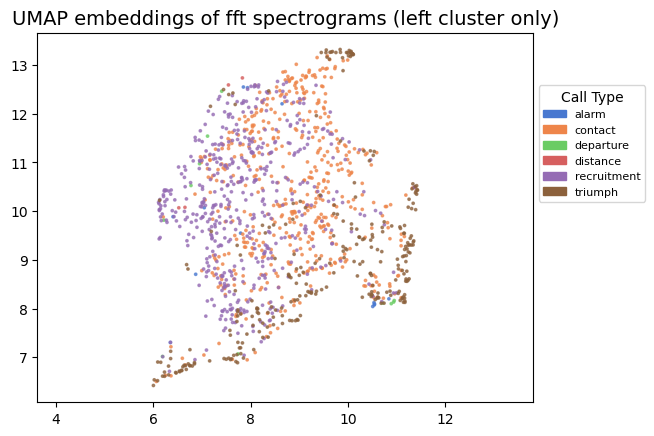

In [294]:
mask = embeddings_spec[:, 0] >= 6
filtered_embeddings = embeddings_spec[mask]
filtered_call_types = labels_and_spectrograms_df["call_type"][mask]

filtered_colors = [call_type_to_color[call_type] for call_type in filtered_call_types]

plt.scatter(
    filtered_embeddings[:, 0],
    filtered_embeddings[:, 1],
    c=filtered_colors,
    alpha=0.7,
    s=3
)
plt.gca().set_aspect('equal', 'datalim')
plt.title('UMAP embeddings of fft spectrograms (left cluster only)', fontsize=14)

legend_patches = [Patch(color=color, label=call_type) for call_type, color in call_type_to_color.items()]
plt.legend(
    handles=legend_patches,
    title="Call Type",
    fontsize=8,
    title_fontsize=10,
    loc="center left",
    bbox_to_anchor=(1.0, 0.7)
)

plt.show()

/var/folders/kl/qgqbw3bd42bf_tybhvnz9vxh0000gn/T/ipykernel_7008/3509562567.py:30: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(


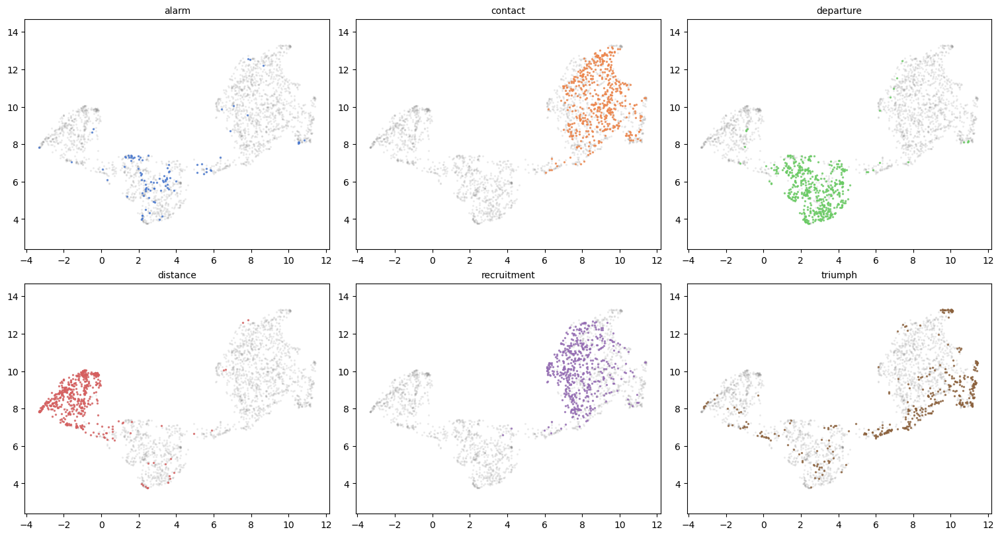

In [342]:
# Plot embedding per call type category
unique_call_types = labels_and_spectrograms_df["call_type"].unique()

cols = 3
rows = 2

fig, axes = plt.subplots(rows, cols, figsize=(5 * cols, 4 * rows), constrained_layout=True)
axes = axes.flatten()

# Determine the global limits to set equal axes
x_min, x_max = embeddings_spec[:, 0].min()-.8, embeddings_spec[:, 0].max()+.8
y_min, y_max = embeddings_spec[:, 1].min(), embeddings_spec[:, 1].max()

for i, call_type in enumerate(unique_call_types):
    ax = axes[i]

    ax.scatter(
        embeddings_spec[:, 0],
        embeddings_spec[:, 1],
        c="grey",
        alpha=0.1,
        s=2
    )

    # Filter embeddings for current call type
    mask = labels_and_spectrograms_df["call_type"] == call_type
    filtered_embeddings = embeddings_spec[mask]
    color = call_type_to_color[call_type]
    
    ax.scatter(
        filtered_embeddings[:, 0],
        filtered_embeddings[:, 1],
        c=color,
        alpha=0.7,
        s=2
    )
    ax.set_title(call_type, fontsize=10)
    ax.set_xlim(x_min, x_max)
    ax.set_ylim(y_min, y_max)
    ax.set_aspect('equal', 'datalim')

plt.show()

## Visualize acoustic features

In [296]:
def _normalize(feature_values):
    return (feature_values - feature_values.min()) / (feature_values.max() - feature_values.min())

In [343]:
def plot_colorcoded_features(feature_columns, feature_titles, embeddings_list, embeddings_titles, calls_df):
    """
    Plots subplots for each feature column and each embedding in a grid layout.

    Parameters:
        feature_columns (list): List of feature column names to visualize.
        feature_titles (list): List of titles corresponding to the feature columns.
        embeddings_list (list): List of embeddings (each as a 2D numpy array).
        embeddings_titles (list): List of titles for each embedding type.
        calls_df (DataFrame): DataFrame containing the feature columns.
    """
    num_features = len(feature_columns)
    num_embeddings = len(embeddings_list)

    fig, axes = plt.subplots(num_features, num_embeddings, figsize=(5 * num_embeddings, 4 * num_features), squeeze=False, gridspec_kw={"width_ratios": [1] * (num_embeddings - 1) + [1.2]})

    colormap = plt.cm.viridis

    for i, (feature_column, feature_title) in enumerate(zip(feature_columns, feature_titles)):
        normalized_values = _normalize(calls_df[feature_column])
        for j, (embeddings, embedding_title) in enumerate(zip(embeddings_list, embeddings_titles)):
            ax = axes[i, j]
            colors = colormap(normalized_values)

            ax.scatter(
                embeddings[:, 0],
                embeddings[:, 1],
                c=colors,
                s=1
            )
            ax.set_aspect('equal', 'datalim')

            # Only add the embedding title at the top of each column
            if i == 0:
                ax.set_title(embedding_title, fontsize=12)

            # Add a colorbar only for the rightmost column
            if j == num_embeddings - 1:
                cbar = fig.colorbar(
                    plt.cm.ScalarMappable(
                        cmap=colormap, 
                        norm=plt.Normalize(
                            vmin=calls_df[feature_column].min(), 
                            vmax=calls_df[feature_column].max()
                        )
                    ), 
                    ax=ax
                )
                cbar.set_label(feature_title, fontsize=10)

    plt.tight_layout(rect=[0, 0, 0.95, 1])  # Adjust layout to fit feature titles on the right
    plt.show()


In [344]:
feature_titles_list = [
    "Duration [s]", 
    "F0 std [kHz]", 
    "F0 mean [kHz]", 
    "F0 range [kHz]", 
    "Min F0 [kHz]", 
    "Max F0 [kHz]",  
    "Mean slope F0 [kHz/s]",  
    "Harmonics to noise ratio [dB]", 
    "F0 first quartile [kHz]", 
    "F0 second quartile [kHz]", 
    "F0 third quartile [kHz]", 
    "Spectral Std [kHz]", 
    "Spectral centroid [kHz]", 
    "Spectral kurtosis", 
    "Spectral skewness", 
    "Temporal Std [s]", 
    "Temporal centroid [s]", 
    "Temporal kurtosis", 
    "Temporal skewness", 
    "Average frequency of first formant [kHz]"]

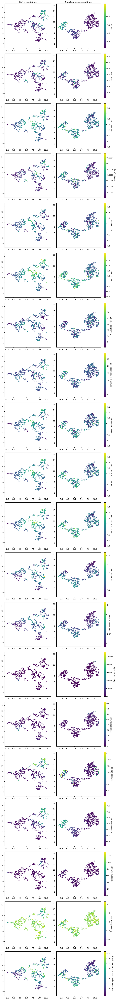

In [345]:
plot_colorcoded_features(
    ["duration", "f0std_dev", "f0mean", "f0range", "f0min", "f0max", "mean_slope", "hnr", "f0_q1", "f0_q2", "f0_q3", "std_s", "centr_s", "kurt_s", "skew_s", "std_t", "centr_t", "kurt_t", "skew_t", "avg_f_form1"], 
    feature_titles_list, 
    [embeddings_paf, embeddings_spec], ["PAF embeddings", "Spectrogram embeddings"], 
    calls_df)

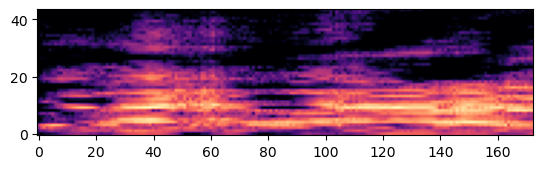

In [349]:
plt.imshow(calls_df.loc[calls_df["skew_t"].idxmin()]["log_padded_spectrogram"], origin="lower", cmap="magma")
plt.show()

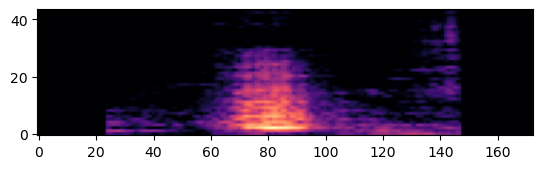

track_ID                                                                GT00255
clip_ID                                                                  G01275
goose_ID                                                                  Birne
call_type                                                               contact
waveform                      [-0.001638 -0.001365 -0.001365 ...  0.        ...
sr                                                                        44100
filepath                      /Users/lenagies/Desktop/Master/Thesis/geese/da...
lfccs                         [[-8.7143866e+02 -8.6761670e+02 -8.6647174e+02...
duration                                                                   0.24
normalized_log_length                                                  0.550558
log_target_duration                                                    0.626884
log_padded_spectrogram        [[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
log_padded_lfccs              [[0. 0. 0.

In [360]:
plt.imshow(calls_df.loc[calls_df["skew_t"].idxmax()]["log_padded_spectrogram"], origin="lower", cmap="magma")
plt.show()
calls_df.loc[calls_df["skew_t"].idxmax()]

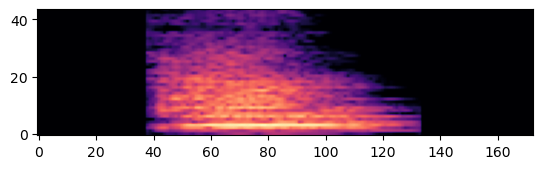

In [352]:
plt.imshow(calls_df.loc[calls_df["kurt_t"].idxmin()]["log_padded_spectrogram"], origin="lower", cmap="magma")
plt.show()

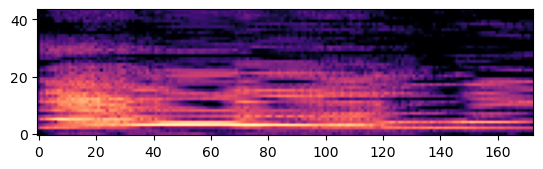

In [353]:
plt.imshow(calls_df.loc[calls_df["kurt_t"].idxmax()]["log_padded_spectrogram"], origin="lower", cmap="magma")
plt.show()

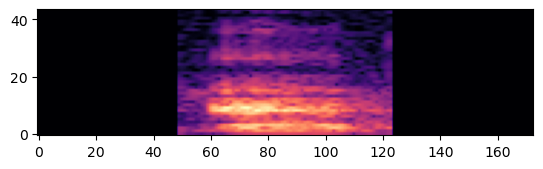

track_ID                                                                GT00973
clip_ID                                                                  G12148
goose_ID                                                             Lausbursch
call_type                                                               triumph
waveform                      [0.01330109 0.00846433 0.00362757 ... 0.004836...
sr                                                                        44100
filepath                      /Users/lenagies/Desktop/Master/Thesis/geese/da...
lfccs                         [[-748.6058    -744.00287   -749.2874    ... -...
duration                                                               0.110181
normalized_log_length                                                  0.321896
log_target_duration                                                    0.381816
log_padded_spectrogram        [[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
log_padded_lfccs              [[0.      

In [359]:
plt.imshow(calls_df.loc[calls_df["skew_s"].idxmin()]["log_padded_spectrogram"], origin="lower", cmap="magma")
plt.show()
calls_df.loc[calls_df["skew_s"].idxmin()]

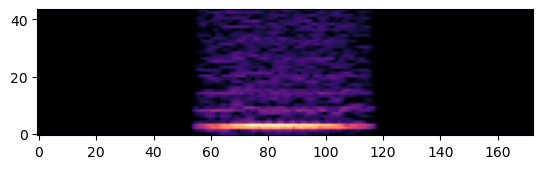

In [355]:
plt.imshow(calls_df.loc[calls_df["skew_s"].idxmax()]["log_padded_spectrogram"], origin="lower", cmap="magma")
plt.show()

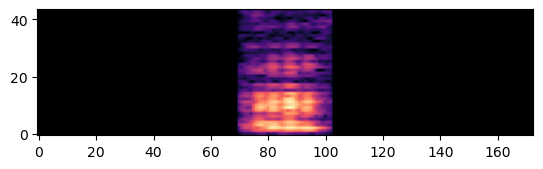

In [356]:
plt.imshow(calls_df.loc[calls_df["kurt_s"].idxmin()]["log_padded_spectrogram"], origin="lower", cmap="magma")
plt.show()

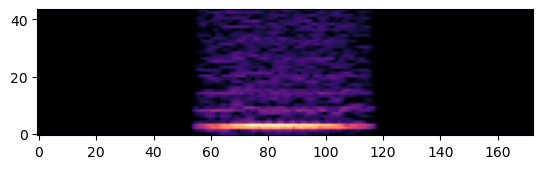

In [357]:
plt.imshow(calls_df.loc[calls_df["kurt_s"].idxmax()]["log_padded_spectrogram"], origin="lower", cmap="magma")
plt.show()

## Clustering

#### k-means

In [300]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score
import matplotlib.cm as cm

In [301]:
# choosing n_clusters with silhouette analysis

# adapted from https://scikit-learn.org/1.5/auto_examples/cluster/plot_kmeans_silhouette_analysis.html#sphx-glr-auto-examples-cluster-plot-kmeans-silhouette-analysis-py

def _plot_silhouette_analysis(data, n_clusters, cluster_labels, silhouette_score, embeddings, centers=None):
            # Create a subplot with 1 row and 2 columns
            fig, (ax1, ax2) = plt.subplots(1, 2)
            fig.set_size_inches(18, 7)

            # The 1st subplot is the silhouette plot
            # The silhouette coefficient can range from -1 to 1
            ax1.set_xlim([-0.1, 1])

            # The (n_clusters+1)*10 is for inserting blank space between silhouette
            # plots of individual clusters, to demarcate them clearly.
            ax1.set_ylim([0, len(data) + (n_clusters + 1) * 10])

            # Compute the silhouette scores for each sample
            sample_silhouette_values = silhouette_samples(data, cluster_labels)

            y_lower = 10
            for i in range(n_clusters):
                # Aggregate the silhouette scores for samples belonging to
                # cluster i, and sort them
                ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

                ith_cluster_silhouette_values.sort()

                size_cluster_i = ith_cluster_silhouette_values.shape[0]
                y_upper = y_lower + size_cluster_i

                color = cm.nipy_spectral(float(i) / n_clusters)
                ax1.fill_betweenx(
                    np.arange(y_lower, y_upper),
                    0,
                    ith_cluster_silhouette_values,
                    facecolor=color,
                    edgecolor=color,
                    alpha=0.7,
                )

                # Label the silhouette plots with their cluster numbers at the middle
                ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

                # Compute the new y_lower for next plot
                y_lower = y_upper + 10  # 10 for the 0 samples

            ax1.set_title("Silhouette plot for the various clusters.")
            ax1.set_xlabel("Silhouette coefficient values")
            ax1.set_ylabel("Cluster label")

            # The vertical line for average silhouette score of all the values
            ax1.axvline(x=silhouette_score, color="red", linestyle="--")

            ax1.set_yticks([])  # Clear the yaxis labels / ticks
            ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

            # 2nd Plot showing the actual clusters formed
            colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
            ax2.scatter(
                embeddings[:, 0], embeddings[:, 1], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
            )

            if centers is not None:
                # Draw white circles at cluster centers
                ax2.scatter(
                    centers[:, 0],
                    centers[:, 1],
                    marker="o",
                    c="white",
                    alpha=1,
                    s=200,
                    edgecolor="k",
                )

                for i, c in enumerate(centers):
                    ax2.scatter(c[0], c[1], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")

            ax2.set_title("Visualization of the clustered data.")
            ax2.set_xlabel("Feature space for the 1st feature")
            ax2.set_ylabel("Feature space for the 2nd feature")

            plt.suptitle(
                "Silhouette analysis for KMeans clustering on sample data with n_clusters = %d"
                % n_clusters,
                fontsize=14,
                fontweight="bold",
            )

            plt.show()


def silhouette_analysis_kmeans(data, embeddings=None, plot_every_step=False, plot_best_clustering=True):
    if embeddings is None:
        embeddings = data

    range_n_clusters = [2, 3, 4, 5, 6, 7, 8, 9]

    max_score, n = -1, 0
    
    for n_clusters in range_n_clusters:
        # Initialize the clusterer with n_clusters value and a random generator
        # seed of 10 for reproducibility.
        clusterer = KMeans(n_clusters=n_clusters, random_state=RANDOM_SEED)
        cluster_labels = clusterer.fit_predict(data)

        # The silhouette_score gives the average value for all the samples.
        # This gives a perspective into the density and separation of the formed clusters
        silhouette_avg = silhouette_score(data, cluster_labels)
        print(
            "For n_clusters =",
            n_clusters,
            "The average silhouette_score is :",
            silhouette_avg,
        )

        if silhouette_avg > max_score:
            max_score, n, labels, centers = silhouette_avg, n_clusters, cluster_labels, clusterer.cluster_centers_

        if plot_every_step:
            _plot_silhouette_analysis(data, n_clusters, cluster_labels, silhouette_avg, embeddings, clusterer.cluster_centers_)
    
    if plot_best_clustering:
         _plot_silhouette_analysis(data, n, labels, max_score, embeddings, centers)
            
    return max_score, n, labels

-------------PAF--------------
For n_clusters = 2 The average silhouette_score is : 0.235195009431308
For n_clusters = 3 The average silhouette_score is : 0.1512508501990523
For n_clusters = 4 The average silhouette_score is : 0.15590269148333372
For n_clusters = 5 The average silhouette_score is : 0.15293680730870543
For n_clusters = 6 The average silhouette_score is : 0.15957932707274292
For n_clusters = 7 The average silhouette_score is : 0.16158775152793872
For n_clusters = 8 The average silhouette_score is : 0.18444035407558335
For n_clusters = 9 The average silhouette_score is : 0.17123933310638095


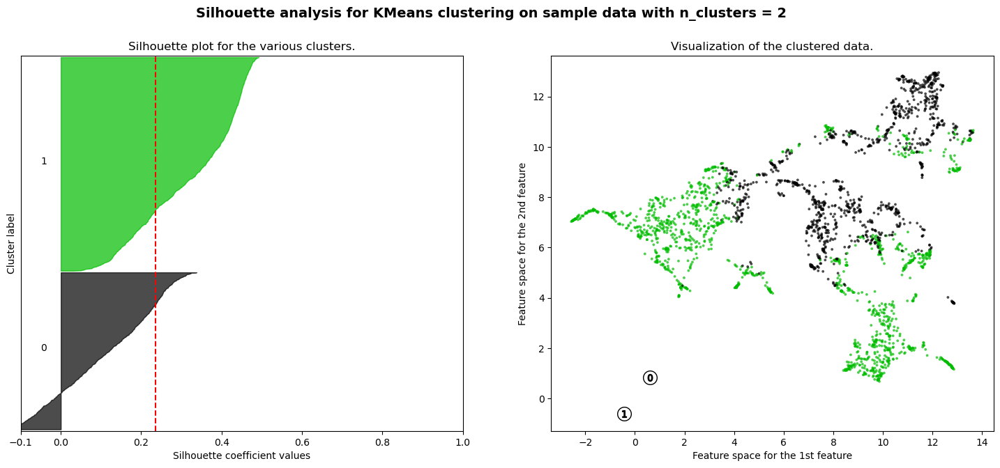

best score with 2 clusters: 0.235195009431308

--------PAF embeddings--------
For n_clusters = 2 The average silhouette_score is : 0.48155385
For n_clusters = 3 The average silhouette_score is : 0.5154977
For n_clusters = 4 The average silhouette_score is : 0.52184695
For n_clusters = 5 The average silhouette_score is : 0.4824039
For n_clusters = 6 The average silhouette_score is : 0.4467883
For n_clusters = 7 The average silhouette_score is : 0.40583092
For n_clusters = 8 The average silhouette_score is : 0.43887794
For n_clusters = 9 The average silhouette_score is : 0.44391683


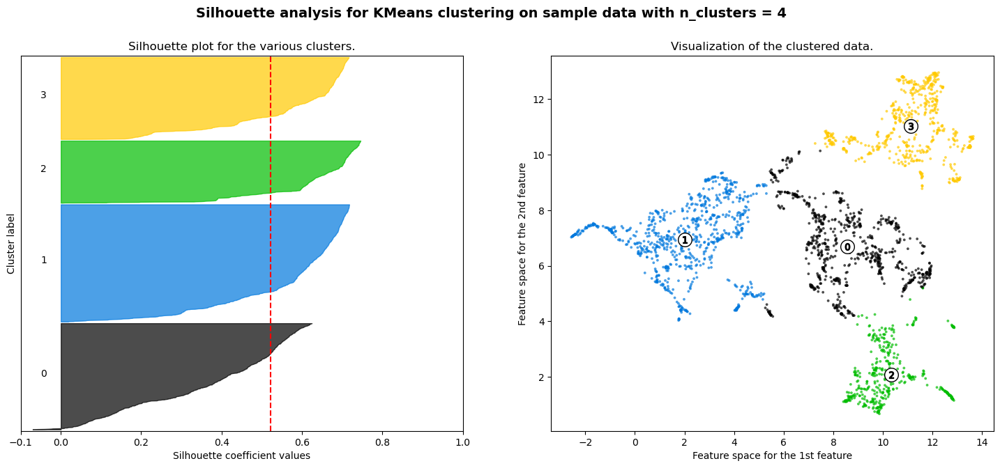

best score with 4 clusters: 0.5218469500541687

----Spectrogram embeddings----
For n_clusters = 2 The average silhouette_score is : 0.64119375
For n_clusters = 3 The average silhouette_score is : 0.45381364
For n_clusters = 4 The average silhouette_score is : 0.49543583
For n_clusters = 5 The average silhouette_score is : 0.5119048
For n_clusters = 6 The average silhouette_score is : 0.5092773
For n_clusters = 7 The average silhouette_score is : 0.45041728
For n_clusters = 8 The average silhouette_score is : 0.4126957
For n_clusters = 9 The average silhouette_score is : 0.39626628


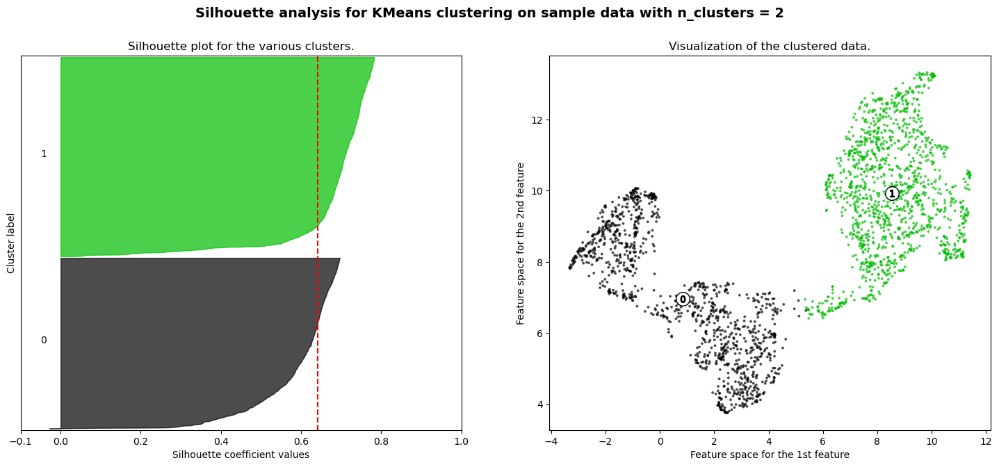

best score with 2 clusters: 0.6411937475204468

---------Spectrograms---------
For n_clusters = 2 The average silhouette_score is : 0.3338209860529486
For n_clusters = 3 The average silhouette_score is : 0.30570203342708513
For n_clusters = 4 The average silhouette_score is : 0.12219442787755196
For n_clusters = 5 The average silhouette_score is : 0.13666962753263304
For n_clusters = 6 The average silhouette_score is : 0.11963616495344111
For n_clusters = 7 The average silhouette_score is : 0.10935800360701724
For n_clusters = 8 The average silhouette_score is : 0.28618563292711374
For n_clusters = 9 The average silhouette_score is : 0.12568825139151574


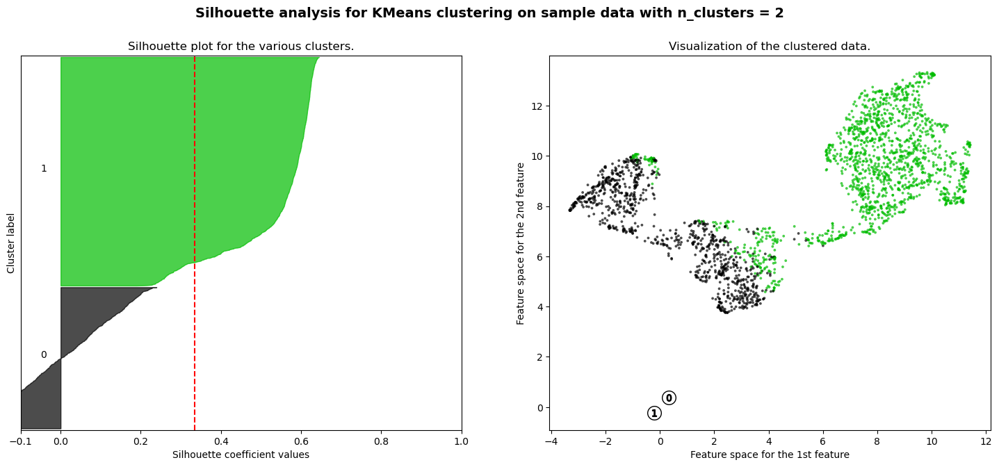

best score with 2 clusters: 0.3338209860529486


In [302]:
print("-------------PAF--------------")
max_sil_score_kmeans_paf, n_clusters_kmeans_paf, labels_kmeans_paf = silhouette_analysis_kmeans(features_scaled, embeddings_paf)
print(f"best score with {n_clusters_kmeans_paf} clusters: {max_sil_score_kmeans_paf}")
print("\n--------PAF embeddings--------")
max_sil_score_kmeans_paf_emb, n_clusters_kmeans_paf_emb, labels_kmeans_paf_emb = silhouette_analysis_kmeans(embeddings_paf)
print(f"best score with {n_clusters_kmeans_paf_emb} clusters: {max_sil_score_kmeans_paf_emb}")
print("\n----Spectrogram embeddings----")
max_sil_score_kmeans_spec_emb, n_clusters_kmeans_spec_emb, labels_kmeans_spec_emb = silhouette_analysis_kmeans(embeddings_spec)
print(f"best score with {n_clusters_kmeans_spec_emb} clusters: {max_sil_score_kmeans_spec_emb}")
print("\n---------Spectrograms---------")
max_sil_score_kmeans_spec, n_clusters_kmeans_spec, labels_kmeans_spec = silhouette_analysis_kmeans(labels_and_spectrograms_scaled, embeddings_spec)
print(f"best score with {n_clusters_kmeans_spec} clusters: {max_sil_score_kmeans_spec}")

#### HDBSCAN

In [303]:
import hdbscan

In [304]:
def silhouette_analysis_hdbscan(data, embeddings=None, plot_every_step=False, plot_best_clustering=True):
    if embeddings is None:
        embeddings = data

    min_cluster_sizes = [20, 50, 100, 300, 25]
    min_sample_numbers = [5, 10, 50, 200, 100]

    max_score, n = -1, 0
    
    for min_size, min_samples in zip(min_cluster_sizes, min_sample_numbers):
        # Initialize the clusterer with n_clusters value and a random generator
        # seed of 10 for reproducibility.
        clusterer = hdbscan.HDBSCAN(min_cluster_size=min_size, min_samples=min_samples, cluster_selection_epsilon=1, prediction_data=True)
        cluster_labels = clusterer.fit_predict(data)

        # The silhouette_score gives the average value for all the samples.
        # This gives a perspective into the density and separation of the formed clusters
        n_clusters = clusterer.labels_.max()+1
        if n_clusters > 1:
            silhouette_avg = silhouette_score(data, cluster_labels)

            print(
                "For n_clusters =",
                n_clusters,
                "The average silhouette_score is :",
                silhouette_avg,
            )

            # no centers because clusters may not be convex
            if silhouette_avg > max_score:
                max_score, n, labels = silhouette_avg, n_clusters, cluster_labels

            if plot_every_step:
                _plot_silhouette_analysis(data, n_clusters, cluster_labels, silhouette_avg, embeddings)
    
    if plot_best_clustering:
         _plot_silhouette_analysis(data, n, labels, max_score, embeddings)
            
    return max_score, n, labels

-------------PAF--------------
For n_clusters = 5 The average silhouette_score is : 0.018757169018963973
For n_clusters = 2 The average silhouette_score is : 0.14617442136969128
For n_clusters = 2 The average silhouette_score is : -0.09787400792895379
For n_clusters = 2 The average silhouette_score is : -0.10441061920404782


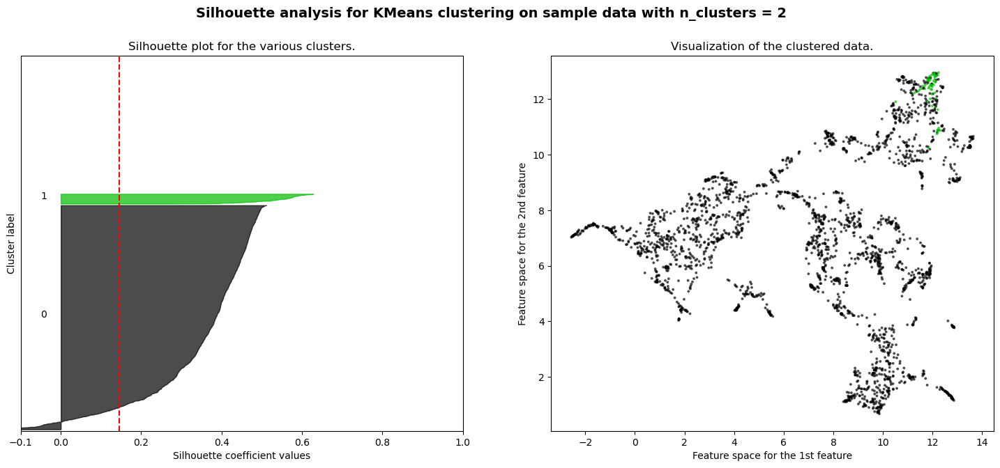

best score with 2 clusters: 0.14617442136969128

--------PAF embeddings--------
For n_clusters = 2 The average silhouette_score is : -0.22111192
For n_clusters = 2 The average silhouette_score is : -0.22111192
For n_clusters = 2 The average silhouette_score is : 0.24677433
For n_clusters = 2 The average silhouette_score is : 0.31656763
For n_clusters = 4 The average silhouette_score is : 0.34649202


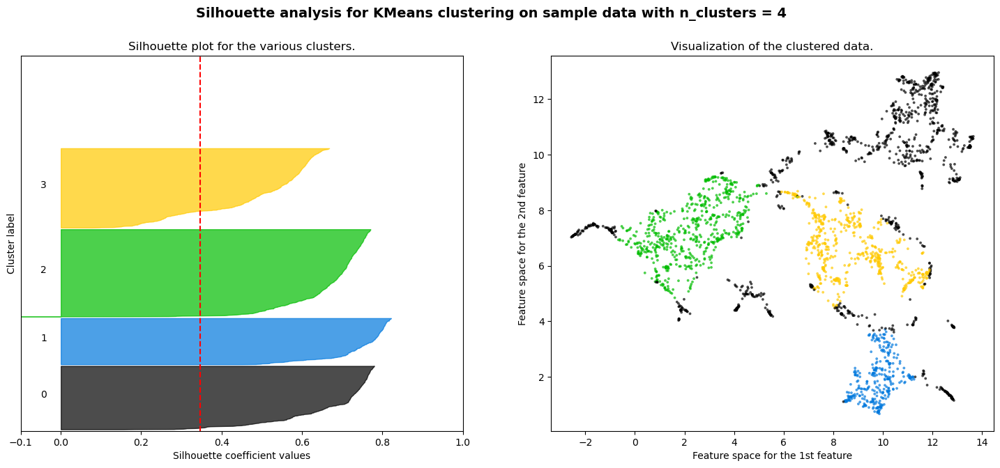

best score with 4 clusters: 0.3464920222759247

----Spectrogram embeddings----
For n_clusters = 2 The average silhouette_score is : 0.31560925
For n_clusters = 2 The average silhouette_score is : 0.36906585
For n_clusters = 3 The average silhouette_score is : 0.51140463
For n_clusters = 2 The average silhouette_score is : 0.64092904
For n_clusters = 3 The average silhouette_score is : 0.547394


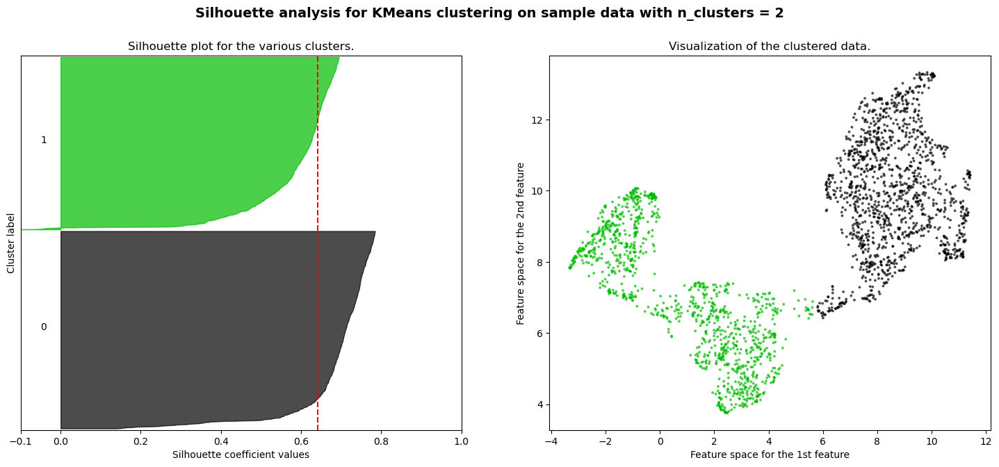

best score with 2 clusters: 0.6409290432929993


In [305]:
print("-------------PAF--------------")
max_sil_score_hdbscan_paf, n_clusters_hdbscan_paf, labels_hdbscan_paf = silhouette_analysis_hdbscan(features_scaled, embeddings_paf)
print(f"best score with {n_clusters_hdbscan_paf} clusters: {max_sil_score_hdbscan_paf}")
print("\n--------PAF embeddings--------")
max_sil_score_hdbscan_paf_emb, n_clusters_hdbscan_paf_emb, labels_hdbscan_paf_emb = silhouette_analysis_hdbscan(embeddings_paf)
print(f"best score with {n_clusters_hdbscan_paf_emb} clusters: {max_sil_score_hdbscan_paf_emb}")
print("\n----Spectrogram embeddings----")
max_sil_score_hdbscan_spec_emb, n_clusters_hdbscan_spec_emb, labels_hdbscan_spec_emb = silhouette_analysis_hdbscan(embeddings_spec)
print(f"best score with {n_clusters_hdbscan_spec_emb} clusters: {max_sil_score_hdbscan_spec_emb}")
# print("\n---------Spectrograms---------")
# max_sil_score_hdbscan_spec, n_clusters_hdbscan_spec, labels_hdbscan_spec = silhouette_analysis_hdbscan(labels_and_spectrograms_scaled, embeddings_spec)
# print(f"best score with {n_clusters_hdbscan_spec} clusters: {max_sil_score_hdbscan_spec}")

##### cluster PAFs

In [306]:
hdbscan_clusters_paf = hdbscan.HDBSCAN(min_cluster_size=30, min_samples=15, cluster_selection_epsilon=1, prediction_data=True)
hdbscan_clusters_paf.fit(features_scaled)
print(hdbscan_clusters_paf.labels_.max()+1)

3


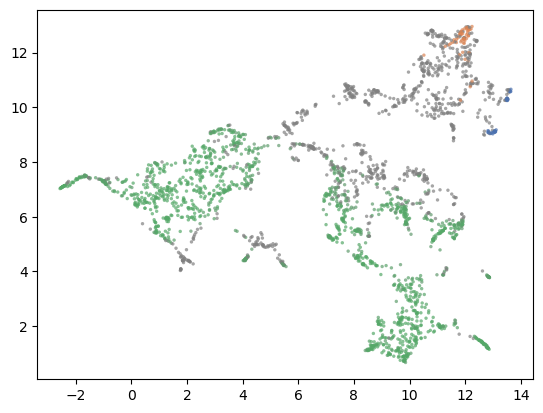

In [307]:
color_palette = sns.color_palette('deep', 8)
cluster_colors = [color_palette[x] if x >= 0
                  else (0.5, 0.5, 0.5)
                  for x in hdbscan_clusters_paf.labels_]
cluster_member_colors = [sns.desaturate(x, p) for x, p in
                         zip(cluster_colors, hdbscan_clusters_paf.probabilities_)]
plt.scatter(*embeddings_paf.T, linewidth=0, c=cluster_member_colors, alpha=0.7, s=6)

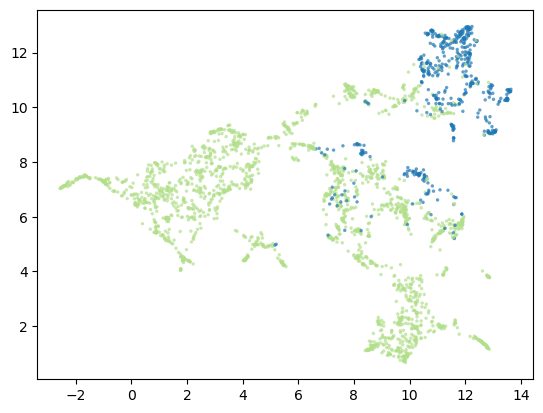

In [308]:
soft_clusters = hdbscan.all_points_membership_vectors(hdbscan_clusters_paf)
color_palette = sns.color_palette('Paired', 12)
cluster_colors = [color_palette[np.argmax(x)]
                  for x in soft_clusters]
plt.scatter(*embeddings_paf.T, linewidth=0, c=cluster_colors, alpha=0.7, s=6)

<Axes: ylabel='$\\lambda$ value'>

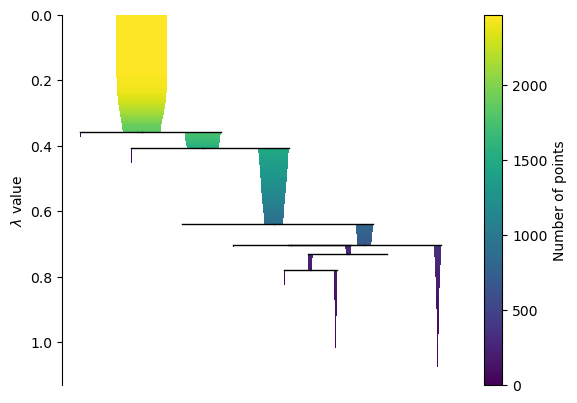

In [309]:
hdbscan_clusters_paf.condensed_tree_.plot()

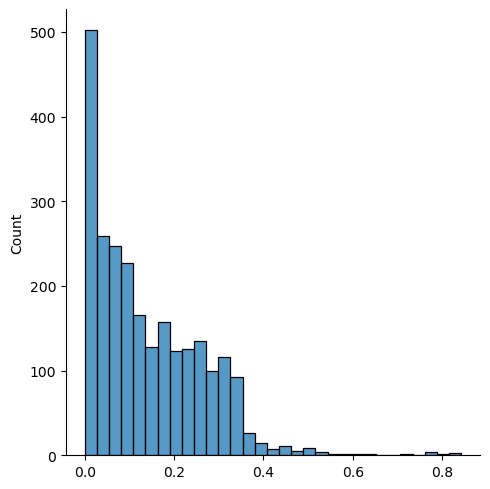

In [310]:
sns.displot(hdbscan_clusters_paf.outlier_scores_[np.isfinite(hdbscan_clusters_paf.outlier_scores_)], rug=False)

##### Cluster the embeddings

In [311]:
hdbscan_clusters_paf_emb = hdbscan.HDBSCAN(min_cluster_size=30, min_samples=25, cluster_selection_epsilon=1, prediction_data=True)
hdbscan_clusters_paf_emb.fit(embeddings_paf)
hdbscan_clusters_paf_emb.labels_.max()+1

np.int64(3)

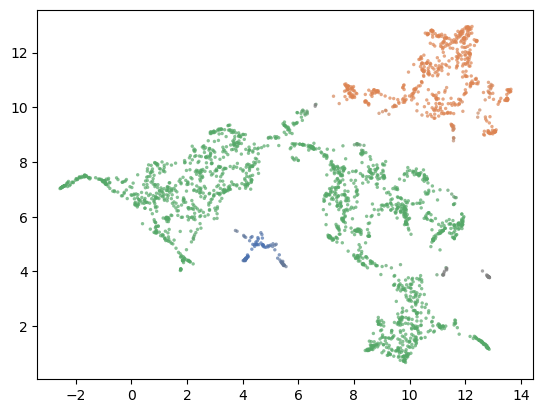

In [312]:
color_palette = sns.color_palette('deep', 8)
cluster_colors = [color_palette[x] if x >= 0
                  else (0.5, 0.5, 0.5)
                  for x in hdbscan_clusters_paf_emb.labels_]
cluster_member_colors = [sns.desaturate(x, p) for x, p in
                         zip(cluster_colors, hdbscan_clusters_paf_emb.probabilities_)]
plt.scatter(*embeddings_paf.T, linewidth=0, c=cluster_member_colors, alpha=0.7, s=6)

<Axes: ylabel='$\\lambda$ value'>

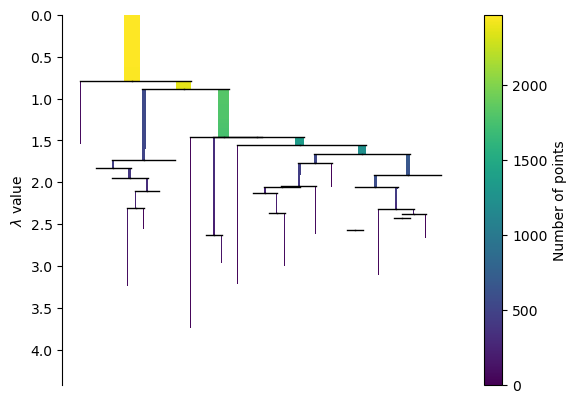

In [313]:
hdbscan_clusters_paf_emb.condensed_tree_.plot()

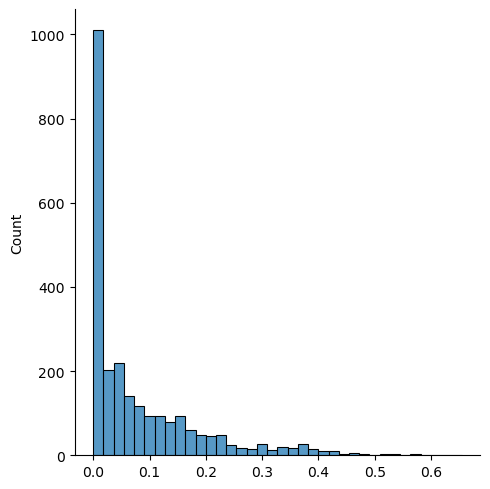

In [314]:
sns.displot(hdbscan_clusters_paf_emb.outlier_scores_[np.isfinite(hdbscan_clusters_paf_emb.outlier_scores_)], rug=False)

Text(0.5, 1.0, 'Noise points of HDBSCAN clustering on PAF embeddings')

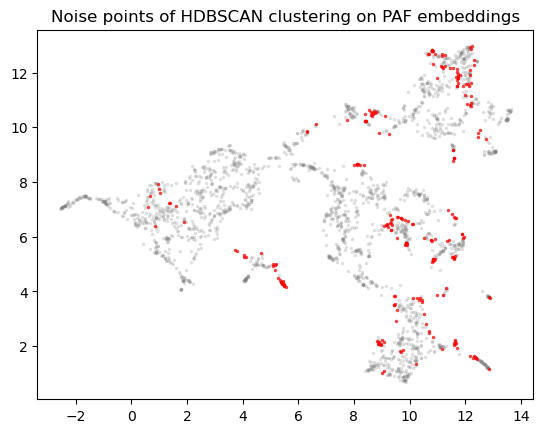

In [315]:
threshold = pd.Series(hdbscan_clusters_paf_emb.outlier_scores_).quantile(0.9)
outliers = np.where(hdbscan_clusters_paf_emb.outlier_scores_ > threshold)[0]
plt.scatter(*embeddings_paf.T, s=6, linewidth=0, c='gray', alpha=0.25)
plt.scatter(*embeddings_paf[outliers].T, linewidth=0, c='red', alpha=0.7, s=6)
plt.title("Noise points of HDBSCAN clustering on PAF embeddings")

##### Cluster spectrogram embeddings

In [316]:
hdbscan_clusters_spec = hdbscan.HDBSCAN(min_cluster_size=25, min_samples=100, cluster_selection_epsilon=.7, prediction_data=True)
hdbscan_clusters_spec.fit(embeddings_spec)
hdbscan_clusters_spec.labels_.max()+1

np.int64(3)

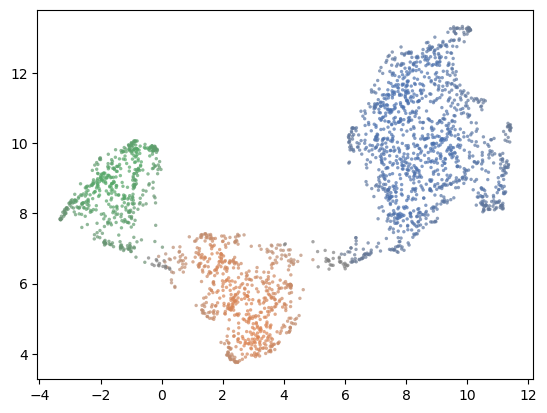

In [317]:
color_palette = sns.color_palette('deep', 8)
cluster_colors = [color_palette[x] if x >= 0
                  else (0.5, 0.5, 0.5)
                  for x in hdbscan_clusters_spec.labels_]
cluster_member_colors = [sns.desaturate(x, p) for x, p in
                         zip(cluster_colors, hdbscan_clusters_spec.probabilities_)]
plt.scatter(*embeddings_spec.T, linewidth=0, c=cluster_member_colors, alpha=0.7, s=6)

<Axes: ylabel='$\\lambda$ value'>

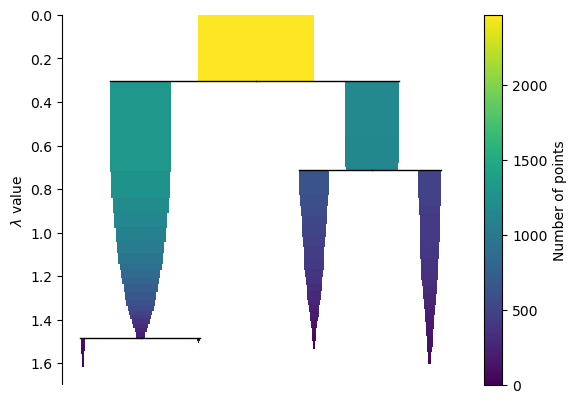

In [318]:
hdbscan_clusters_spec.condensed_tree_.plot()

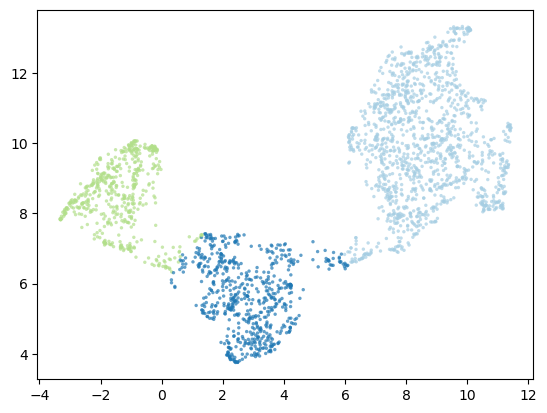

In [319]:
soft_clusters = hdbscan.all_points_membership_vectors(hdbscan_clusters_spec)
color_palette = sns.color_palette('Paired', 12)
cluster_colors = [color_palette[np.argmax(x)]
                  for x in soft_clusters]
plt.scatter(*embeddings_spec.T, linewidth=0, c=cluster_colors, alpha=0.7, s=6)

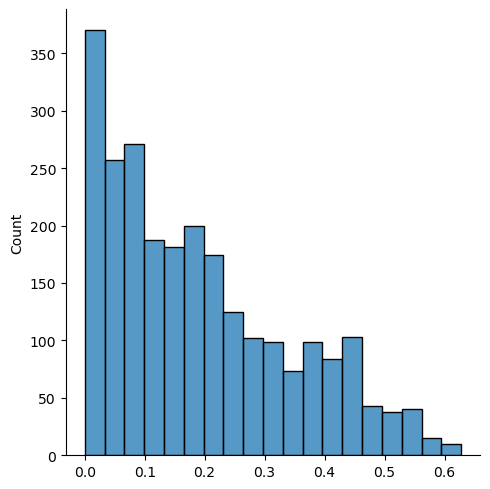

In [320]:
sns.displot(hdbscan_clusters_spec.outlier_scores_[np.isfinite(hdbscan_clusters_spec.outlier_scores_)], rug=False)

Text(0.5, 1.0, 'Noise points of HDBSCAN clustering on spectrogram embeddings')

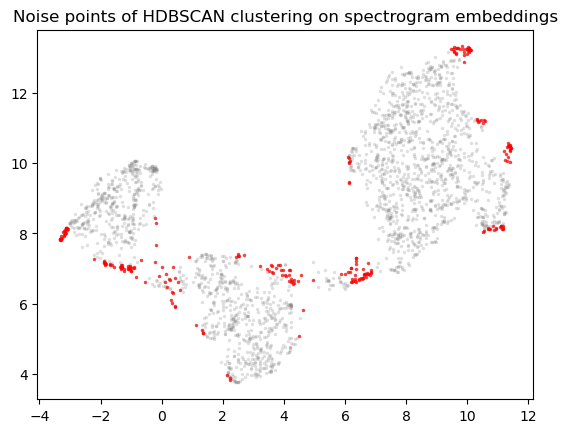

In [321]:
threshold = pd.Series(hdbscan_clusters_spec.outlier_scores_).quantile(0.9)
outliers = np.where(hdbscan_clusters_spec.outlier_scores_ > threshold)[0]
plt.scatter(*embeddings_spec.T, s=6, linewidth=0, c='gray', alpha=0.25)
plt.scatter(*embeddings_spec[outliers].T, linewidth=0, c='red', alpha=0.7, s=6)
plt.title("Noise points of HDBSCAN clustering on spectrogram embeddings")

#### Leiden clustering

In [322]:
import leidenalg as la
import igraph as ig
from tqdm.auto import tqdm

In [323]:
# The code in the function leiden_cluster_from_nn_graph is adapted from Tim Sainburgs workshop code TODO how do I reference this correctly?
def leiden_cluster_from_nn_graph(graph, to_column, resolution_parameter=1):
    knn_indices, knn_dists, rp_forest = graph

    # Extract edges and weights
    edges = []
    weights = []

    for i in tqdm(range(knn_indices.shape[0])):
        for j in range(1, knn_indices.shape[1]):
            edges.append((i, knn_indices[i, j]))
            weights.append(knn_dists[i, j])

    # Create an igraph graph
    g = ig.Graph(edges=edges, directed=False)
    g.es['weight'] = weights

    # Perform Leiden clustering
    partition = la.find_partition(g, la.RBConfigurationVertexPartition, weights=g.es['weight'], seed=RANDOM_SEED, resolution_parameter=resolution_parameter)

    # Extract cluster labels
    labels = np.array(partition.membership)
    calls_df[to_column] = labels

    return labels, partition

def plot_clusters_on_embeddings(labels, embeddings, title=None):
    unique_labels = np.unique(labels)
    # set colors for labels
    colors = sns.color_palette("muted", len(unique_labels))
    color_dict = {label: color for label, color in zip(unique_labels, colors)}
    c = [color_dict[i] for i in labels]

    plt.scatter(embeddings[:,0], embeddings[:,1], s=1, c=c)
    if title:
        plt.title(title)

    # Create legend elements
    legend_elements = [
        plt.Line2D(
            [0], [0],
            marker='o',
            color='w',
            markerfacecolor=color_dict[label],
            markersize=8,
            label=f"Cluster {label}",
        )
        for label in unique_labels
    ]

    # Add legend to the plot
    plt.legend(
        handles=legend_elements,
        loc="center left",
        bbox_to_anchor=(1, 0.5),
        fontsize="small",
        title="Clusters",
        frameon=True,
    )
    
def plot_cluster_examples(column_name, unique_labels, examples_per_cluster=6):
    num_clusters = len(unique_labels)
    fig, axs = plt.subplots(num_clusters, examples_per_cluster, figsize=(examples_per_cluster * 4, num_clusters * 4))

    # Ensure axs is a 2D array even if there's only one cluster
    if num_clusters == 1:
        axs = np.expand_dims(axs, axis=0)

    # Loop through each cluster
    for cluster_idx, cluster in enumerate(unique_labels):
        # Filter spectrograms belonging to the current cluster
        
        cluster_spectrograms = calls_df[calls_df[column_name] == cluster]

        # Randomly sample spectrograms from the cluster
        sampled_spectrograms = cluster_spectrograms.sample(min(examples_per_cluster, len(cluster_spectrograms)), random_state=RANDOM_SEED)

        # Loop through each selected spectrogram
        for example_idx, (index, row) in enumerate(sampled_spectrograms.iterrows()):
            # Get the spectrogram data
            spectrogram = row["log_padded_spectrogram"]  

            # Plot the spectrogram
            ax = axs[cluster_idx, example_idx]
            ax.imshow(spectrogram, aspect='auto', origin='lower', cmap='viridis')
            ax.set_title(f"Cluster {cluster}, Call_type: {row['call_type']}")
            ax.axis('off')

    # Adjust layout and show the plot
    plt.tight_layout()
    plt.show()

100%|██████████| 2471/2471 [00:00<00:00, 165685.50it/s]


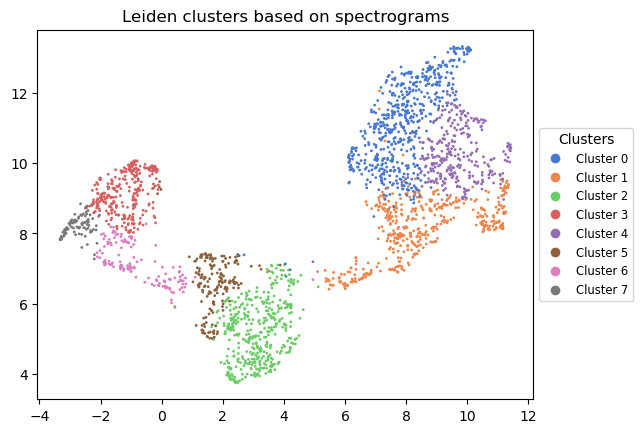

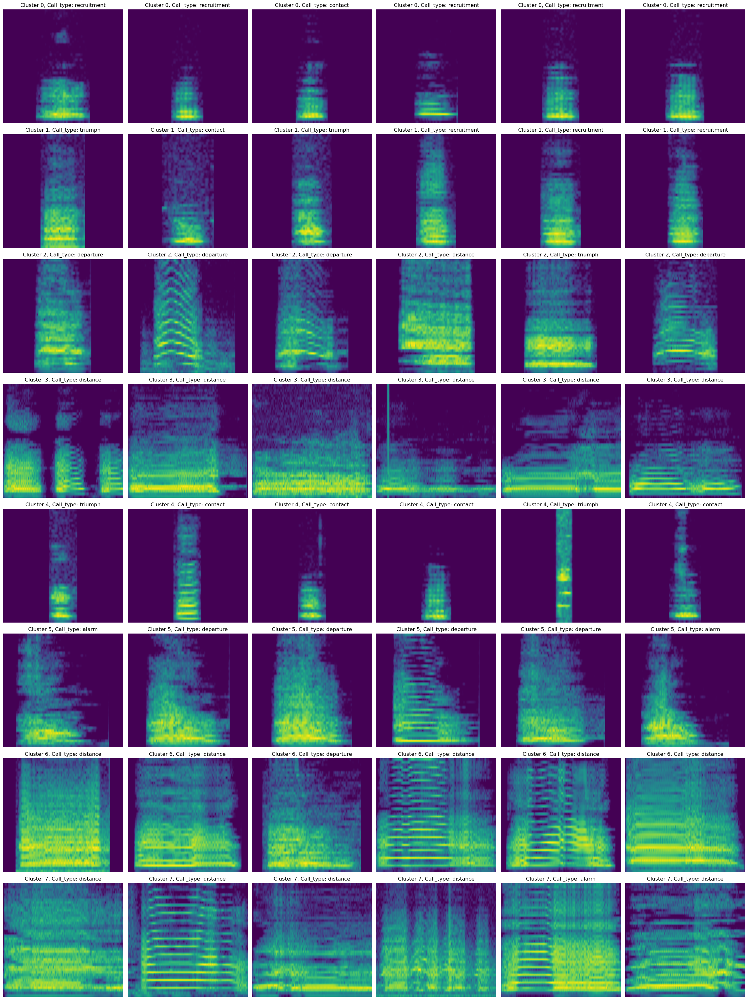

In [324]:
labels, leiden_partition_specs = leiden_cluster_from_nn_graph(nn_results_spec, "leiden_cluster_spectrogram", resolution_parameter=0.8)
plot_clusters_on_embeddings(labels, embeddings_spec, title="Leiden clusters based on spectrograms")
plot_cluster_examples("leiden_cluster_spectrogram", np.unique(labels))

  0%|          | 0/2471 [00:00<?, ?it/s]

100%|██████████| 2471/2471 [00:00<00:00, 120943.42it/s]


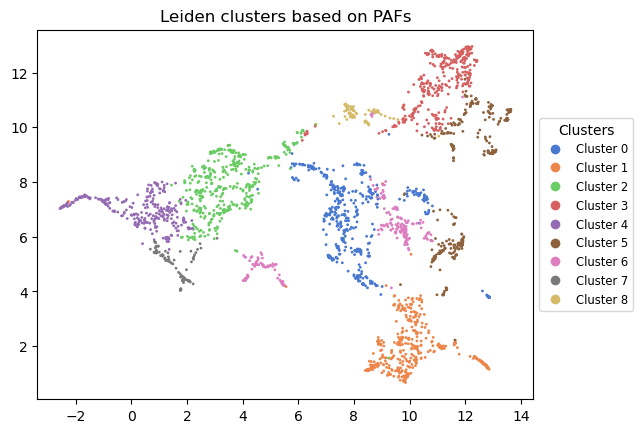

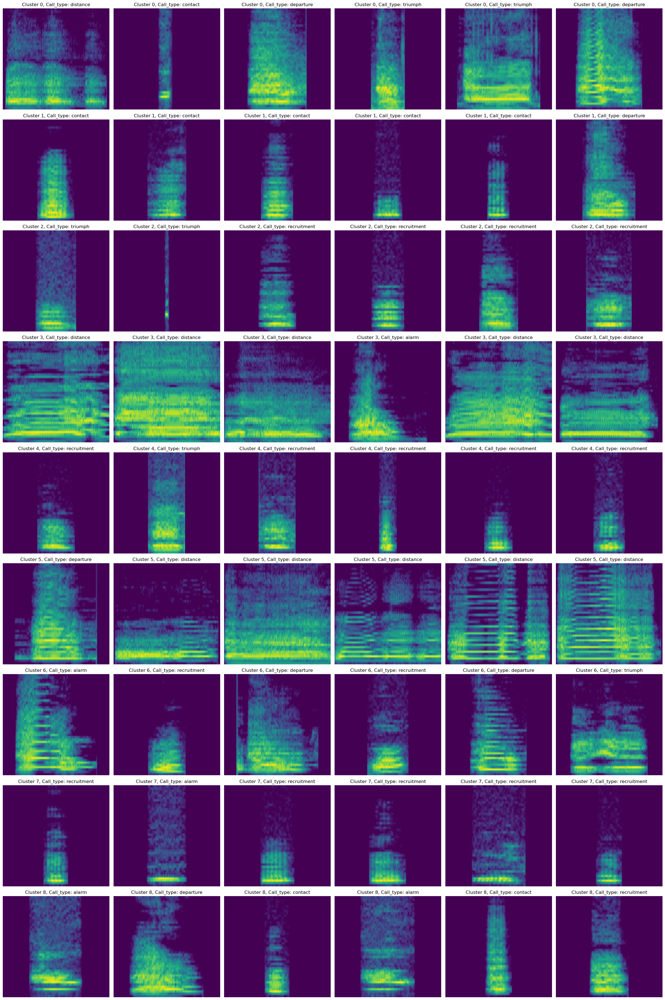

In [325]:
labels, leiden_partition_pafs = leiden_cluster_from_nn_graph(nn_results_paf, "leiden_cluster_paf", resolution_parameter=0.5)
plot_clusters_on_embeddings(labels, embeddings_paf, title="Leiden clusters based on PAFs")
plot_cluster_examples("leiden_cluster_paf", np.unique(labels))

## Validation

##### Hopkins statistic

In [326]:
from random import sample
from numpy.random import uniform
from math import isnan
from sklearn.neighbors import NearestNeighbors # TODO move to use before UMAP

In [327]:
# adapted from https://datascience.stackexchange.com/questions/14142/cluster-tendency-using-hopkins-statistic-implementation-in-python and https://matevzkunaver.wordpress.com/2017/06/20/hopkins-test-for-cluster-tendency/  
def hopkins(X):
    d = X.shape[1]
    n = len(X) # rows
    m = int(0.07 * n) # proportion of random subset
    nbrs = NearestNeighbors(n_neighbors=1).fit(X)
 
    rand_X = sample(range(0, n, 1), m)
 
    uid = []
    wid = []
    for j in range(0, m):
        u_dist, _ = nbrs.kneighbors(uniform(np.amin(X,axis=0),np.amax(X,axis=0),d).reshape(1, -1), 2, return_distance=True)
        uid.append(u_dist[0][1])
        w_dist, _ = nbrs.kneighbors(X[rand_X[j]].reshape(1, -1), 2, return_distance=True)
        wid.append(w_dist[0][1])
 
    H = sum(uid) / (sum(uid) + sum(wid))
    if isnan(H):
        print(uid, wid)
        H = 0

    return H

In [328]:
print("--------hopkins statistic--------\n")
print(f"PAFs:\t\t\t\t {hopkins(features_scaled)}")
print(f"Embeddings of PAFs:\t\t {hopkins(embeddings_paf)}")
print(f"Embeddings of spectrograms:\t {hopkins(embeddings_spec)}")
print(f"Spectrograms:\t\t\t {hopkins(labels_and_spectrograms_scaled)}")

--------hopkins statistic--------

PAFs:				 0.9107018031845231
Embeddings of PAFs:		 0.9482034969792452
Embeddings of spectrograms:	 0.952697747656135
Spectrograms:			 0.7943198999446034


##### Silhouette score

In [329]:
print("--------silhouette score--------\n")
print(f"PAFs + k-means:\t\t\t\t {max_sil_score_kmeans_paf}")
print(f"Embeddings of PAFs + k-means:\t\t {max_sil_score_kmeans_paf_emb}")
print(f"Embeddings of spectrograms + k-means:\t {max_sil_score_kmeans_spec_emb}")
print(f"Spectrograms + k-means:\t\t\t {max_sil_score_kmeans_spec}")
print(f"PAFs + HDBSCAN:\t\t\t\t {silhouette_score(features_scaled, hdbscan_clusters_paf.fit_predict(features_scaled))}")
print(f"Embeddings of PAFs + HDBSCAN:\t\t {silhouette_score(embeddings_paf, hdbscan_clusters_paf.fit_predict(embeddings_paf))}")
print(f"Embeddings of spectrograms + HDBSCAN:\t {silhouette_score(embeddings_spec, hdbscan_clusters_spec.fit_predict(embeddings_spec))}")

_, knn_dists, _ = nn_results_paf
print(f"PAFs + Leiden:\t\t\t\t {silhouette_score(knn_dists, leiden_partition_pafs.membership)}")
_, knn_dists, _ = nn_results_spec
print(f"Spectrograms + Leiden:\t\t\t {silhouette_score(knn_dists, leiden_partition_specs.membership)}")

--------silhouette score--------

PAFs + k-means:				 0.235195009431308
Embeddings of PAFs + k-means:		 0.5218469500541687
Embeddings of spectrograms + k-means:	 0.6411937475204468
Spectrograms + k-means:			 0.3338209860529486
PAFs + HDBSCAN:				 0.0951237776717775
Embeddings of PAFs + HDBSCAN:		 -0.22111192345619202
Embeddings of spectrograms + HDBSCAN:	 0.5473939776420593
PAFs + Leiden:				 -0.25281742215156555
Spectrograms + Leiden:			 -0.05677689239382744


##### V-measure

In [330]:
from sklearn.metrics.cluster import v_measure_score

In [331]:
print("--------V-measure--------\n")
print(f"PAFs + k-means:\t\t\t\t {v_measure_score(calls_df['encoded_call_type'], labels_kmeans_paf)}, n_clusters: {n_clusters_kmeans_paf}")
print(f"Embeddings of PAFs + k-means:\t\t {v_measure_score(calls_df['encoded_call_type'], labels_kmeans_paf_emb)}, n_clusters: {n_clusters_kmeans_paf_emb}")
print(f"Embeddings of spectrograms + k-means:\t {v_measure_score(calls_df['encoded_call_type'], labels_kmeans_spec_emb)}, n_clusters: {n_clusters_kmeans_spec_emb}")
print(f"PAFs + HDBSCAN:\t\t\t\t {v_measure_score(calls_df['encoded_call_type'], hdbscan_clusters_paf.fit_predict(features_scaled))}, n_clusters: {hdbscan_clusters_paf.labels_.max()+1}")
print(f"Embeddings of PAFs + HDBSCAN:\t\t {silhouette_score(np.asarray(calls_df['encoded_call_type']).reshape(-1, 1), hdbscan_clusters_paf_emb.fit_predict(embeddings_paf))}, n_clusters: {hdbscan_clusters_paf_emb.labels_.max()+1}")
print(f"Embeddings of spectrograms + HDBSCAN:\t {silhouette_score(np.asarray(calls_df['encoded_call_type']).reshape(-1, 1), hdbscan_clusters_spec.fit_predict(embeddings_spec))}, n_clusters: {hdbscan_clusters_spec.labels_.max()+1}")
print(f"PAFs + Leiden:\t\t\t\t {silhouette_score(np.asarray(calls_df['encoded_call_type']).reshape(-1, 1), leiden_partition_pafs.membership)}, n_clusters: {np.max(leiden_partition_pafs.membership)}")
print(f"Spectrograms + Leiden:\t\t\t {silhouette_score(np.asarray(calls_df['encoded_call_type']).reshape(-1, 1), leiden_partition_specs.membership)}, n_clusters: {np.max(leiden_partition_specs.membership)}")

--------V-measure--------

PAFs + k-means:				 0.19891779672553364, n_clusters: 2
Embeddings of PAFs + k-means:		 0.5173858152558056, n_clusters: 4
Embeddings of spectrograms + k-means:	 0.45857711199936296, n_clusters: 2
PAFs + HDBSCAN:				 0.2090300551208833, n_clusters: 3
Embeddings of PAFs + HDBSCAN:		 -0.17233563206910057, n_clusters: 3
Embeddings of spectrograms + HDBSCAN:	 0.09470745620800199, n_clusters: 3
PAFs + Leiden:				 0.023464252160181553, n_clusters: 8
Spectrograms + Leiden:			 -0.15053556261874448, n_clusters: 7
